<a href="https://colab.research.google.com/github/Lakshya977/ship-img-recognisation/blob/main/shipdetection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
%pip install ultralytics
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.3/981.3 kB 28.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 71.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 71.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 57.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 17.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 107.9 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstal

In [2]:
!pip install squarify

In [3]:
from ultralytics import YOLO
import squarify
import matplotlib.pyplot as plt
import cv2
import os
import random
import pandas as pd
import matplotlib.image as mpimg
import seaborn as sns

sns.set_style('darkgrid')

%matplotlib inline

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [4]:
!pip install ultralytics opencv-python matplotlib kaggle

In [5]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"lakshyaone","key":"c8c2319e7ebff798a02cdf7eb256a11b"}'}

In [6]:
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [7]:
!kaggle datasets download -d siddharthkumarsah/ships-in-aerial-images

Dataset URL: https://www.kaggle.com/datasets/siddharthkumarsah/ships-in-aerial-images
License(s): CC-BY-SA-4.0


In [8]:
!unzip -q ships-in-aerial-images.zip -d /content/dataset

In [9]:
!ls /content/dataset

ships-aerial-images


In [10]:
import os

dataset_path = "/content/dataset/ships-aerial-images"
print(os.listdir(dataset_path))

['train', 'valid', 'test', 'data.yaml']


In [11]:
import glob

train_images = glob.glob("/content/dataset/ships-aerial-images/train/images/*.jpg")
train_labels = glob.glob("/content/dataset/ships-aerial-images/train/labels/*.txt")

print(f" Train Images: {len(train_images)}, Labels: {len(train_labels)}")

 Train Images: 9697, Labels: 9697


In [14]:
yaml_path = "/content/dataset/ships-aerial-images/data.yaml"

yaml_content = """path: /content/dataset/ships-aerial-images
train: train/images  # Ensure this folder exists
val: valid/images  # Corrected from 'val/images' to 'valid/images'
nc: 1
names: ["ship"]
"""


with open(yaml_path, "w") as f:
    f.write(yaml_content)

print("OKAY")

OKAY


In [15]:
from ultralytics import YOLO

model = YOLO("yolov8n.pt")

model.train(
    data="/content/dataset/ships-aerial-images/data.yaml",
    epochs=5,
    imgsz=320,
    batch=8,
    workers=4
)

Ultralytics 8.3.112 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/dataset/ships-aerial-images/data.yaml, epochs=5, time=None, patience=100, batch=8, imgsz=320, save=True, save_period=-1, cache=False, device=None, workers=4, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxe

train: Scanning /content/dataset/ships-aerial-images/train/labels.cache... 9697 images, 351 backgrounds, 2 corrupt: 100%|██████████| 9697/9697 [00:00<?, ?it/s]

train: /content/dataset/ships-aerial-images/train/images/1__20180714_180427_1029__-118-20071740708637_33-73029905538088_png.rf.330efa80ecbf49d6ceac7071288d64b4.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0249]
train: /content/dataset/ships-aerial-images/train/images/1__20180714_180427_1029__-118-21100741654266_33-732092454738826_png.rf.7243f2b58b505e51950850f4b26081ba.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0079]
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 709, len(boxes) = 19454. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 222.8±94.6 MB/s, size: 16.7 KB)


val: Scanning /content/dataset/ships-aerial-images/valid/labels.cache... 2165 images, 68 backgrounds, 0 corrupt: 100%|██████████| 2165/2165 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 172, len(boxes) = 3720. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 320 train, 320 val
Using 2 dataloader workers
Logging results to runs/detect/train2
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5     0.701G      1.821      1.959      1.436         13        320: 100%|██████████| 1212/1212 [02:14<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 136/136 [00:13<00:00, 10.10it/s]


                   all       2165       3720      0.431      0.289      0.254      0.121

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5     0.725G      1.796      1.695       1.43         70        320: 100%|██████████| 1212/1212 [02:05<00:00,  9.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 136/136 [00:13<00:00, 10.12it/s]


                   all       2165       3720      0.501      0.227      0.255      0.122

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5     0.725G       1.71      1.535      1.385         15        320: 100%|██████████| 1212/1212 [02:02<00:00,  9.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 136/136 [00:13<00:00, 10.19it/s]

                   all       2165       3720      0.517      0.334      0.337      0.169



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5     0.725G      1.628      1.403      1.335         12        320: 100%|██████████| 1212/1212 [01:59<00:00, 10.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 136/136 [00:12<00:00, 10.63it/s]

                   all       2165       3720      0.514      0.334      0.353      0.187



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      0.74G      1.517      1.259      1.266         22        320: 100%|██████████| 1212/1212 [02:00<00:00, 10.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 136/136 [00:12<00:00, 10.61it/s]

                   all       2165       3720      0.508      0.384      0.382       0.21



5 epochs completed in 0.192 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 6.2MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.112 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 136/136 [00:12<00:00, 10.51it/s]


                   all       2165       3720      0.508      0.384      0.382       0.21
Speed: 0.1ms preprocess, 1.1ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to runs/detect/train2


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f9ff2bdb5d0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

In [17]:
from google.colab import files

files.download('/content/runs/detect/train2/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [18]:
from ultralytics import YOLO

model = YOLO("/content/runs/detect/train2/weights/best.pt")

model.predict(source="/content/dataset/ships-aerial-images/test/images", save=True)


WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/1573 /content/dataset/ships-aerial-images/test/images/02e39612d_jpg.rf.cc5483bb711f080d12b644ff62cf977a.jpg: 320x320 1 ship, 10.8ms
image 2/1573 /content/dataset/ships-aerial-images/test/images/04-33800_jpg.rf.c45762dfac8f4c20534434159df41ad2.jpg: 320x320 (no detections), 7.8ms
image 3/1573 /content/dataset/ships-aerial-images/test/images/043d8815e_jpg.rf.702fa31e03a8a1c28e5fb63c561ac16e.jpg: 320x320 1 ship, 6.4ms
image 4/1573 /content/dataset/

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'ship'}
 obb: None
 orig_img: array([[[74, 72, 24],
         [71, 69, 21],
         [69, 67, 19],
         ...,
         [87, 83, 35],
         [79, 75, 27],
         [73, 69, 21]],
 
        [[81, 79, 31],
         [78, 76, 28],
         [74, 72, 24],
         ...,
         [82, 78, 30],
         [81, 77, 29],
         [78, 74, 26]],
 
        [[85, 83, 35],
         [82, 80, 32],
         [78, 76, 28],
         ...,
         [78, 74, 26],
         [81, 77, 29],
         [77, 73, 25]],
 
        ...,
 
        [[77, 70, 27],
         [76, 69, 26],
         [74, 68, 23],
         ...,
         [72, 65, 22],
         [72, 65, 22],
         [72, 65, 22]],
 
        [[76, 69, 26],
         [76, 69, 26],
         [75, 69, 24],
         ...,
         [73, 66, 23],
         [71, 64, 21],
         [69, 62, 19]],
 
        [[72, 65, 22],
      

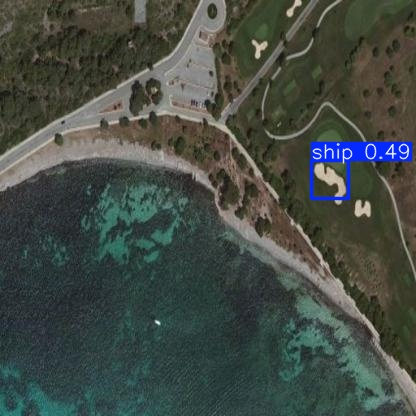

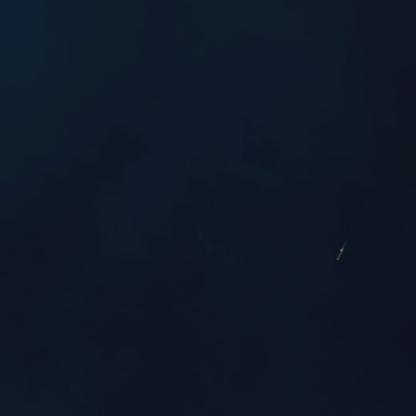

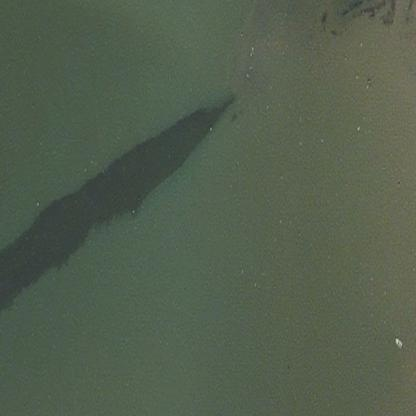

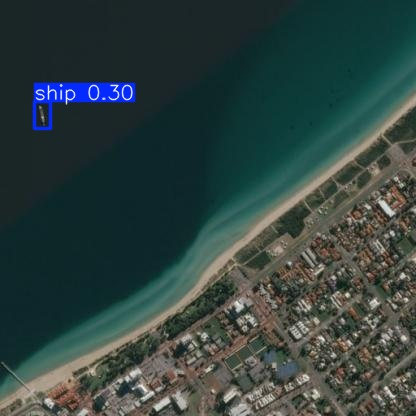

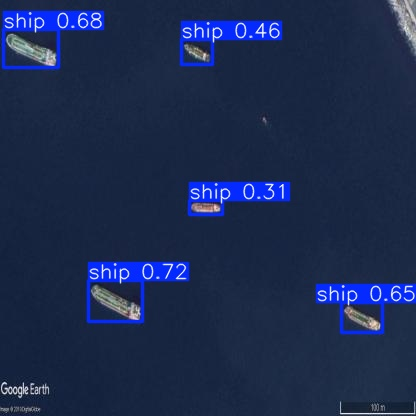

...

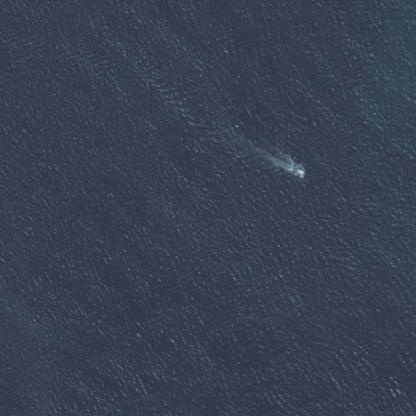

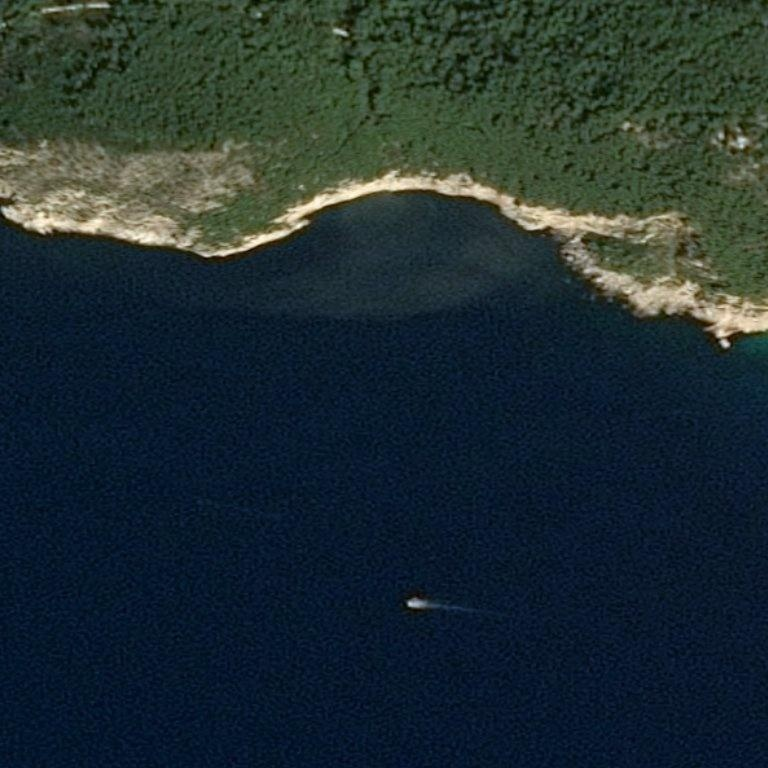

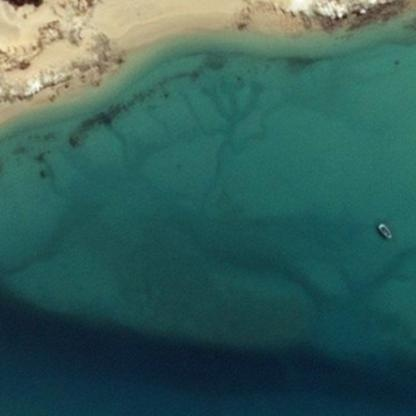

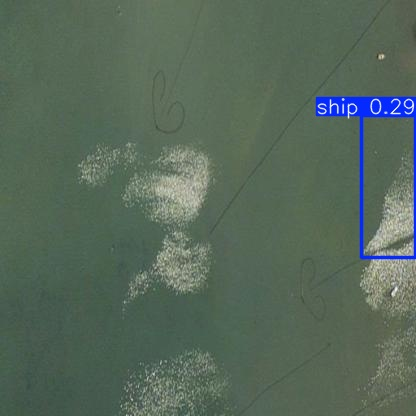

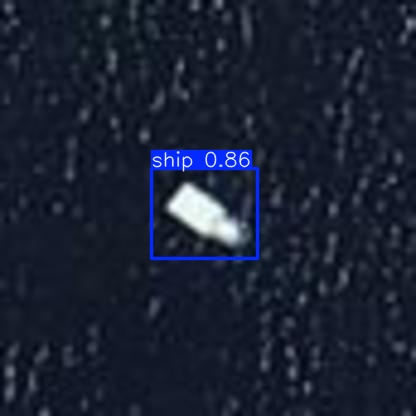

In [19]:
import glob
from PIL import Image
from IPython.display import display


predicted_images = glob.glob("/content/runs/detect/predict/*.jpg")


for img_path in predicted_images[:50]:
    display(Image.open(img_path))

In [20]:
import shutil
from google.colab import files
import glob

# Find the latest prediction folder
pred_folders = sorted(glob.glob("/content/runs/detect/predict*"))
if pred_folders:
    latest_pred_folder = pred_folders[-1]  # Get the latest prediction folder
    zip_path = "/content/predictions.zip"

    # Zip the folder
    shutil.make_archive(zip_path.replace(".zip", ""), 'zip', latest_pred_folder)

    # Download the zip file
    files.download(zip_path)
    print(f"Download the file from: {zip_path}")
else:
    print("No prediction results found!")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Download the file from: /content/predictions.zip


In [21]:
from ultralytics import YOLO

model = YOLO("/content/runs/detect/train2/weights/best.pt")  # Your trained model
results = model.predict(source="/content/dataset/ships-aerial-images/test/images", save=False)



WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/1573 /content/dataset/ships-aerial-images/test/images/02e39612d_jpg.rf.cc5483bb711f080d12b644ff62cf977a.jpg: 320x320 1 ship, 11.0ms
image 2/1573 /content/dataset/ships-aerial-images/test/images/04-33800_jpg.rf.c45762dfac8f4c20534434159df41ad2.jpg: 320x320 (no detections), 10.7ms
image 3/1573 /content/dataset/ships-aerial-images/test/images/043d8815e_jpg.rf.702fa31e03a8a1c28e5fb63c561ac16e.jpg: 320x320 1 ship, 10.6ms
image 4/1573 /content/datase

In [22]:
import os
import cv2

output_folder = "/content/square_ships"
os.makedirs(output_folder, exist_ok=True)

# Square detection threshold
tolerance = 0.1  # 10% difference between width and height

# Loop through results
for result in results:
    img_path = result.path
    img = cv2.imread(img_path)
    draw = False

    for box in result.boxes:
        x1, y1, x2, y2 = map(int, box.xyxy[0])
        width = x2 - x1
        height = y2 - y1

        if abs(width - height) / max(width, height) < tolerance:
            # Draw only if square-ish
            cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
            draw = True

    if draw:  # Save only if square ship is detected
        filename = os.path.basename(img_path)
        cv2.imwrite(os.path.join(output_folder, filename), img)


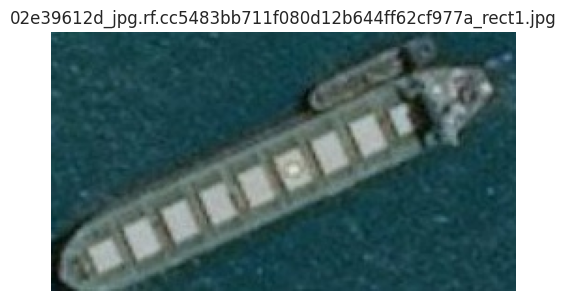

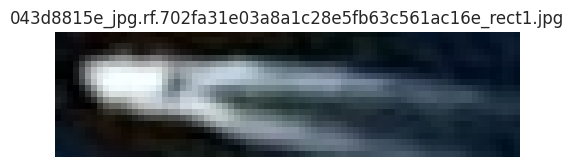

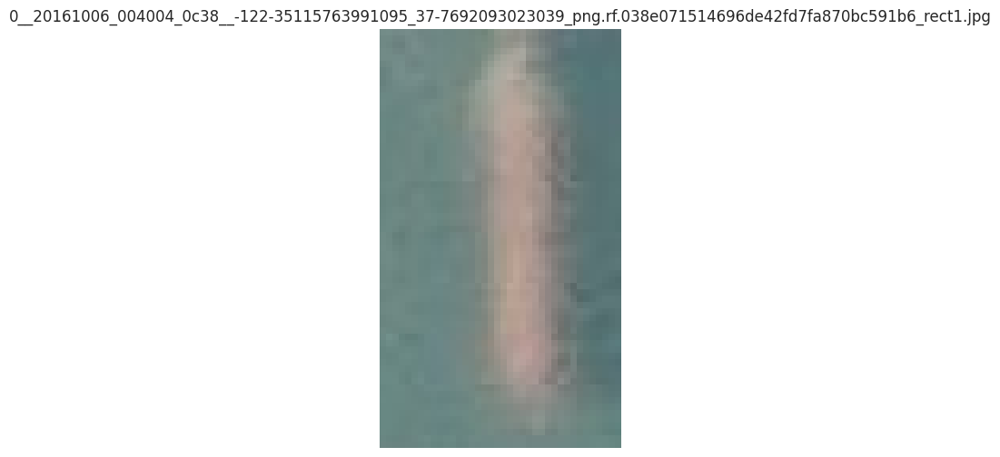

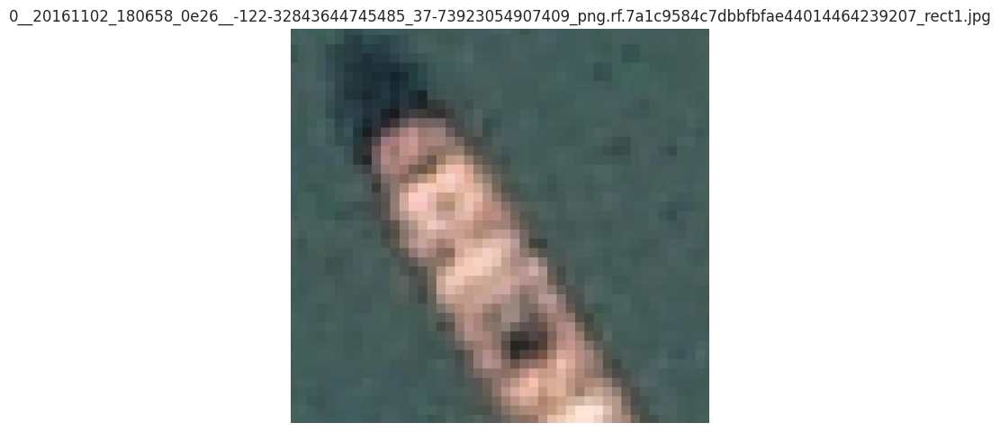

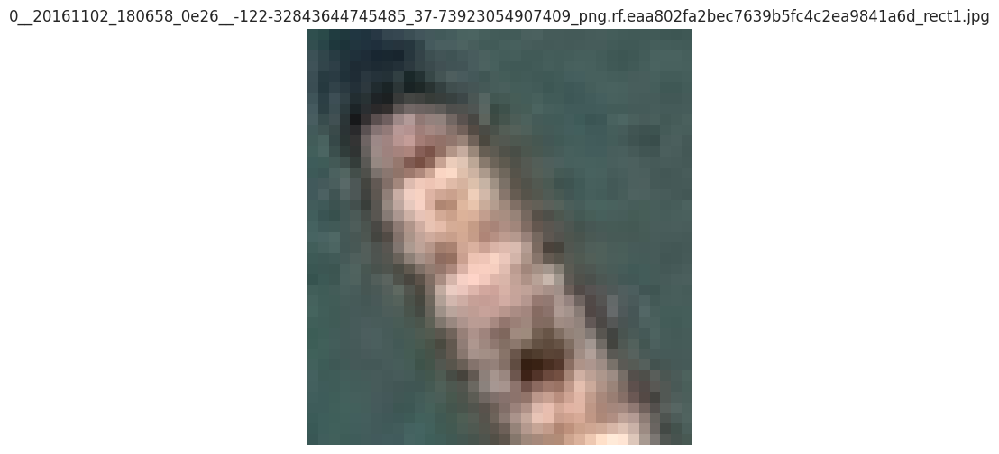

...

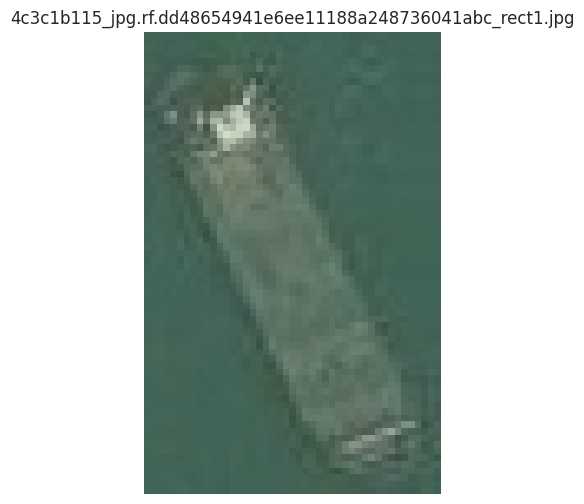

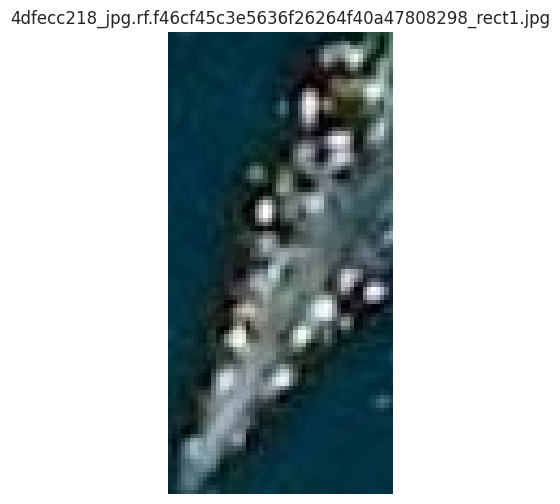

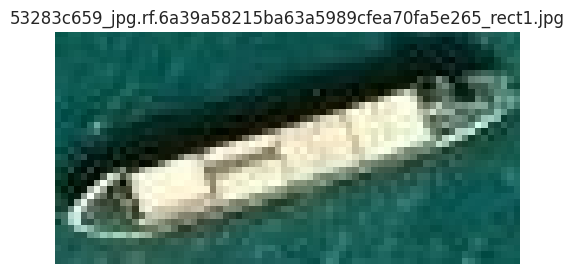

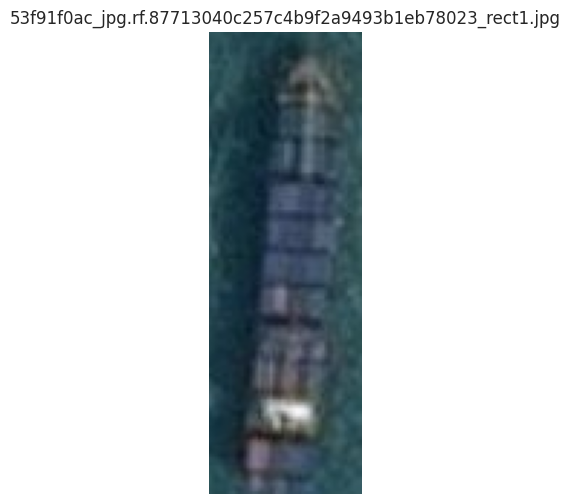

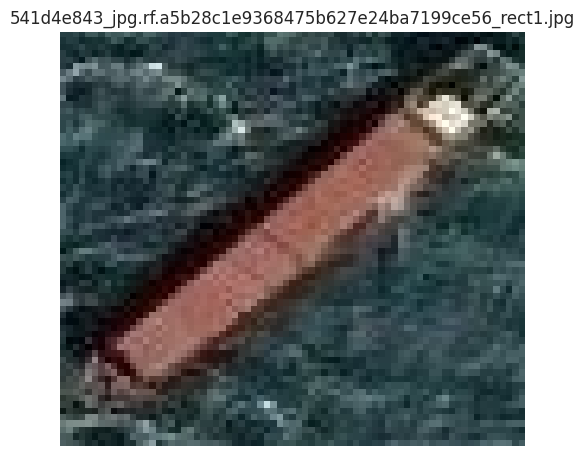

In [27]:
import matplotlib.pyplot as plt
import glob

output_images = sorted(glob.glob(output_folder + "/*.jpg"))

# Display few sample images
for image_path in output_images[:50]:  # Show first 5
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(6, 6))
    plt.imshow(img_rgb)
    plt.axis("off")
    plt.title(os.path.basename(image_path))
    plt.show()


In [28]:
import zipfile
import glob
import os

# Path to the folder containing the images
output_folder = "/content/only_rectangles_with_ships"  # Make sure this is your actual folder path

# Get all image paths in the folder (adjust file type if needed)
image_paths = glob.glob(os.path.join(output_folder, "*.jpg"))

# Path for the zip file
zip_file_path = "/content/only_rectangles_with_ships.zip"

# Create a zip file
with zipfile.ZipFile(zip_file_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
    for image_path in image_paths:
        if os.path.exists(image_path):
            zipf.write(image_path, os.path.basename(image_path))
        else:
            print(f"Warning: {image_path} not found!")

# Provide a download link
from google.colab import files
files.download(zip_file_path)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>